# Voyager Images: a simo-corbo side project

In [75]:
import numpy as np
import matplotlib.pyplot as plt
import scipy

In [76]:
# Load the WAV file
sample_rate, audio_data = scipy.io.wavfile.read('resources/voyager_images_384khz.wav')
audio_data = audio_data[:, 0]  # Use only the first channel

In [77]:
def plot_frequencies(Sxx, frequencies, specific_time_ms):
    # find nearest time index
    specific_time_index = np.argmin(np.abs(times - specific_time_ms / 1000))


    plt.plot(frequencies, Sxx[:, specific_time_index])
    plt.xlabel('Frequency [Hz]')
    plt.ylabel('Amplitude')
    plt.title(f'Spectrogram at {specific_time_ms} ms')
    plt.show()
    # return the dominant frequency
    return frequencies[np.argmax(Sxx[:, specific_time_index])]


In [78]:
def plot_frequencies_range(Sxx, frequencies, times, start_time_ms, end_time_ms):
    # find nearest time index
    start_time_index = np.argmin(np.abs(times - start_time_ms / 1000))
    end_time_index = np.argmin(np.abs(times - end_time_ms / 1000))

    plt.plot(frequencies, np.mean(Sxx[:, start_time_index:end_time_index], axis=1))
    plt.xlabel('Frequency [Hz]')
    plt.ylabel('Amplitude')
    plt.title(f'Spectrogram between {start_time_ms} and {end_time_ms} ms')
    plt.show()
    # return the dominant frequency
    return frequencies[np.argmax(np.mean(Sxx[:, start_time_index:end_time_index], axis=1))]

In [79]:
# compute the spectrogram
frequencies, times, Sxx = scipy.signal.spectrogram(audio_data, fs=sample_rate, nperseg=1024, noverlap=512)

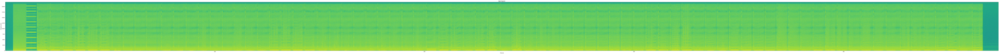

In [80]:
# show the spectrogram
plt.pcolormesh(times, frequencies, 10 * np.log10(Sxx))
plt.ylabel('Frequency [Hz]')
plt.xlabel('Time [s]')
plt.title('Spectrogram')
# set a long figure
plt.gcf().set_size_inches(200, 10)
plt.show()

The first part of the signal starts at 3.68130, with the following spectrogram
The main frequency is 129.2 Hz

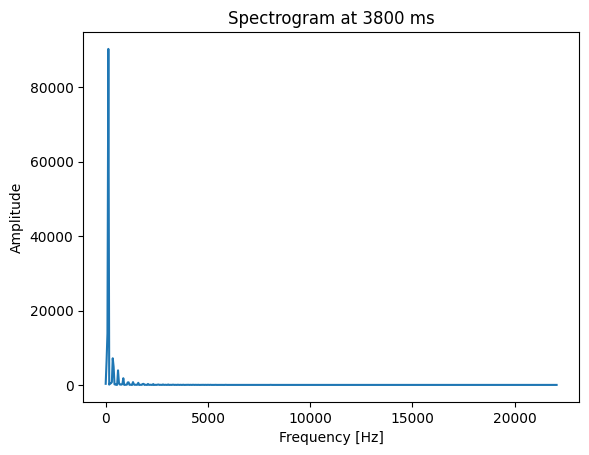

np.float64(129.19921875)

In [81]:
plot_frequencies(Sxx, frequencies, 3800)

At time 9970 ms the signal changes again, with the following spectrogram

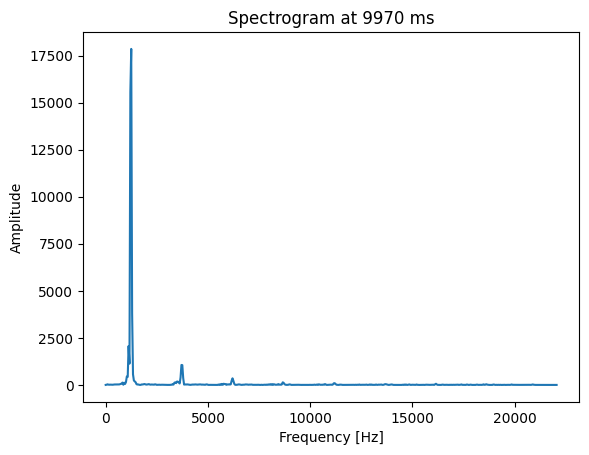

np.float64(1248.92578125)

In [82]:
plot_frequencies(Sxx, frequencies, 9970)

In [83]:
# Let's assume that the images are in 4:3 aspect ratio
width=512
height=width*3//4

In [86]:
# Let's assume that the images are in 4:3 aspect ratio
width=512
height=width*3//4

# The starting time of the images
start_time_ms = 15460

# Normalize the audio data
audio_data = audio_data / np.max(np.abs(audio_data))

# Create a blank image
image = np.zeros((height, width, 3), dtype=np.uint8)

